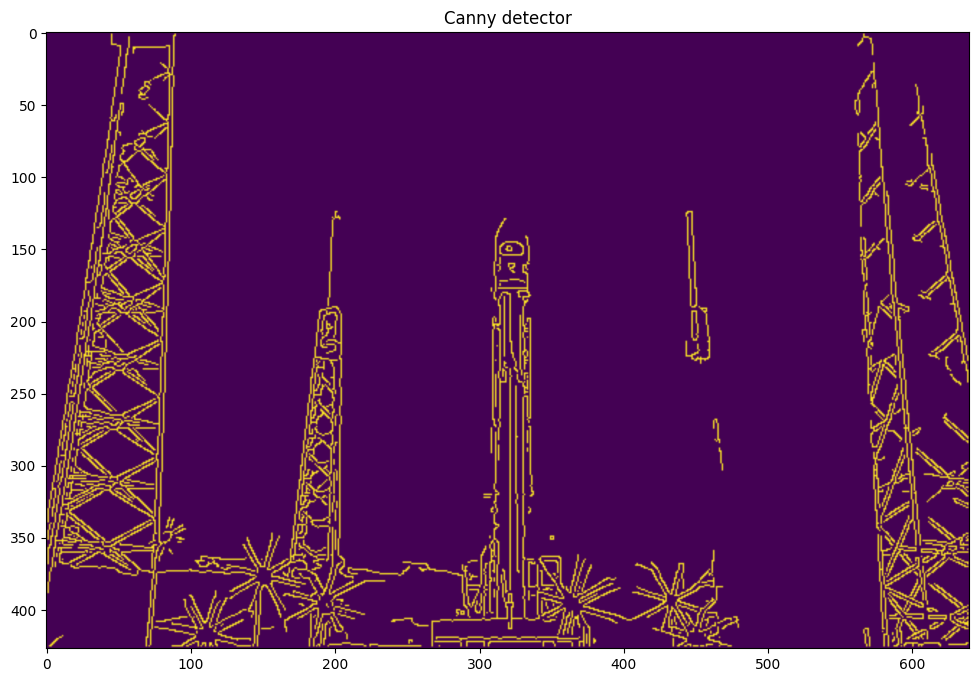

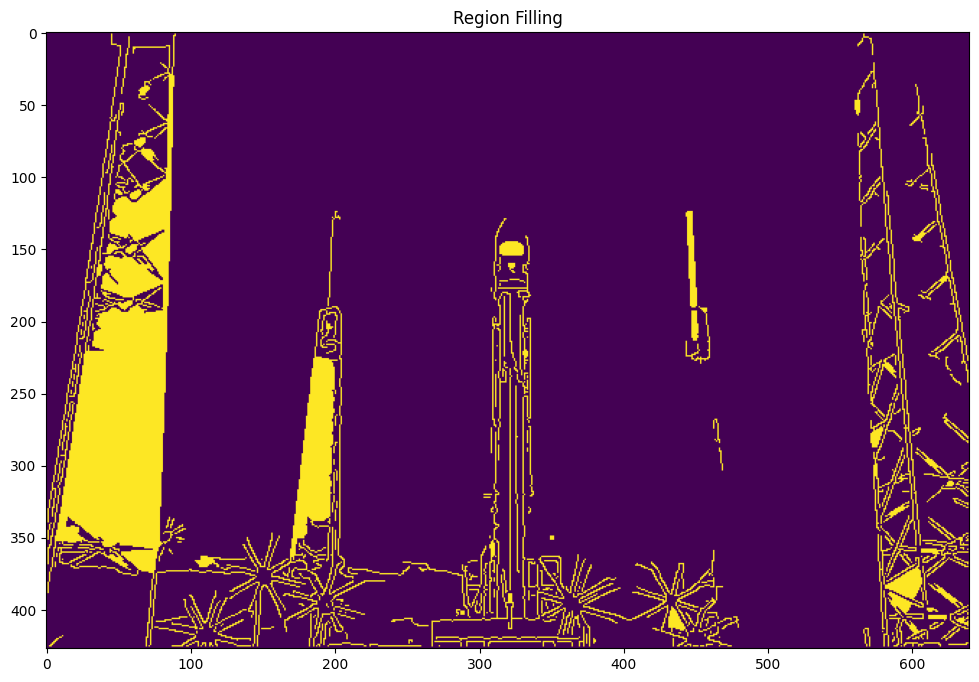

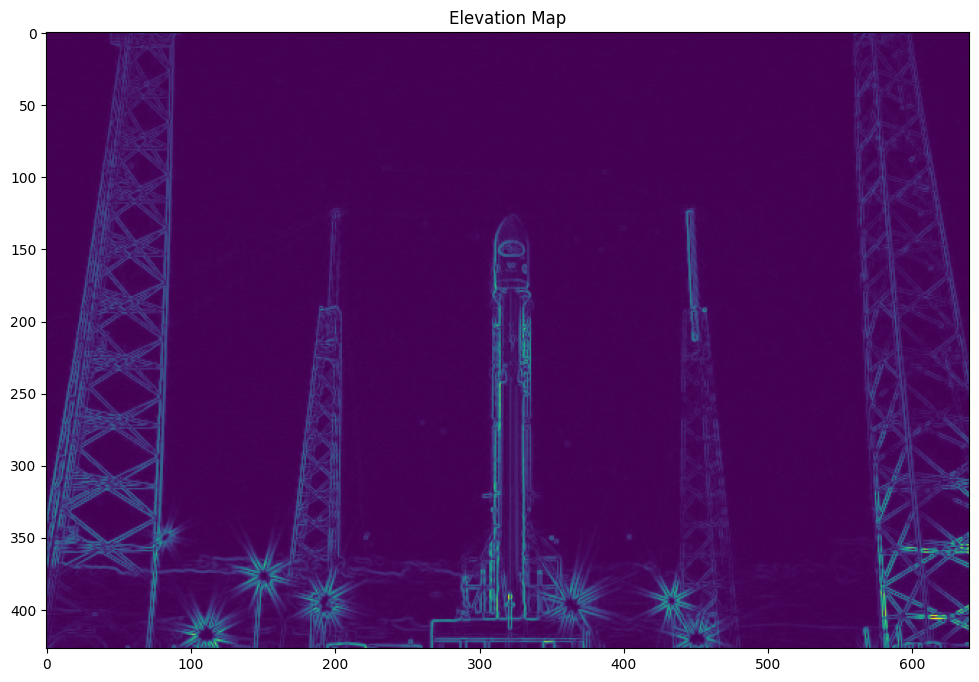

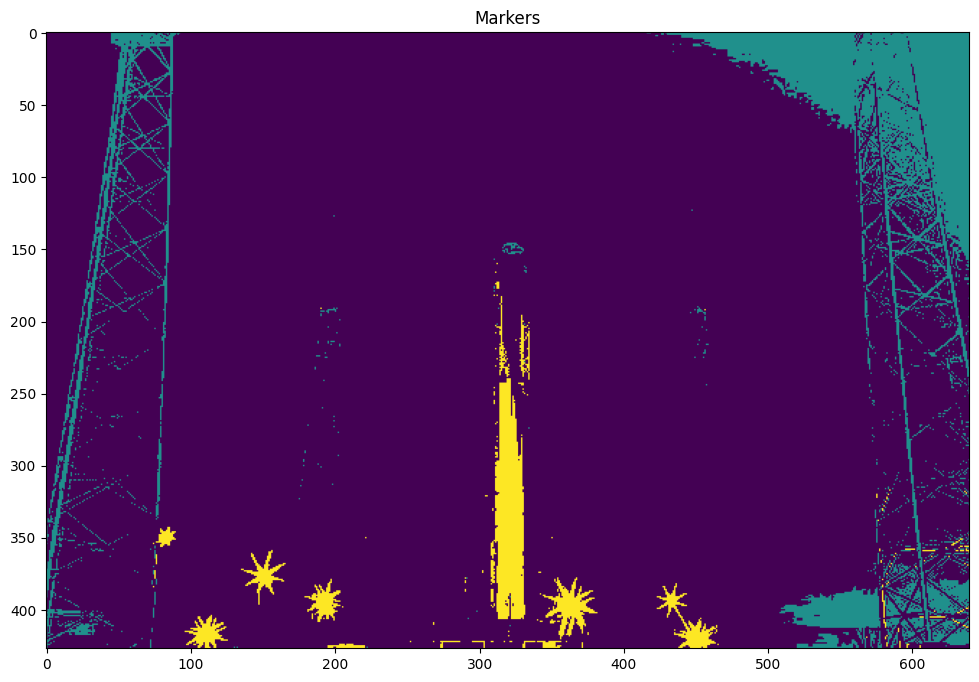

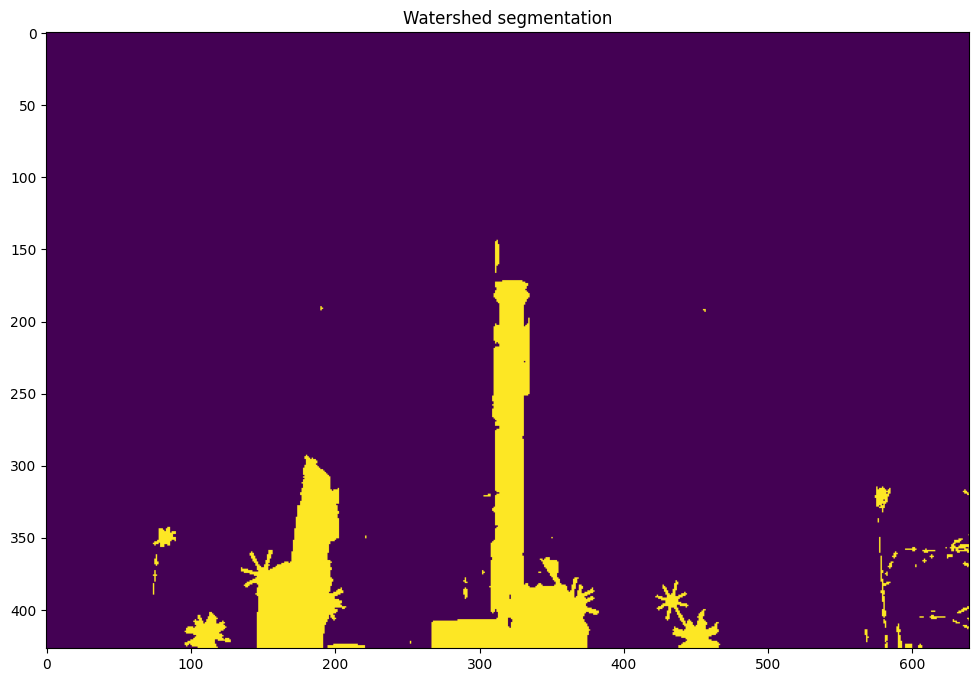

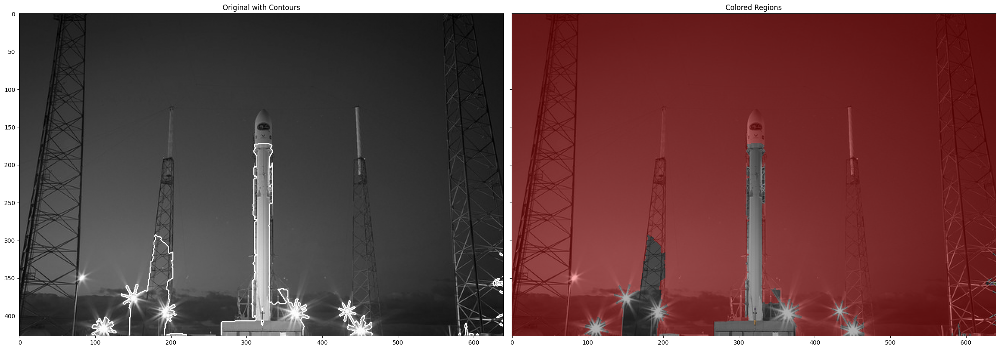

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import canny
from skimage import data, morphology
from skimage.color import rgb2gray, label2rgb
from skimage import data, io, filters, segmentation, measure, morphology, transform
from skimage.filters import sobel, gaussian
from skimage.segmentation import watershed, felzenszwalb, slic
import scipy.ndimage as nd

#Edge-based и region-based segmentation
plt.rcParams["figure.figsize"] = (12,8)
%matplotlib inline

rocket = data.rocket()
rocket_wh = rgb2gray(rocket)

edges = canny(rocket_wh)
plt.figure()
plt.imshow(edges, interpolation='gaussian')
plt.title('Canny detector')
plt.show()

fill_im = nd.binary_fill_holes(edges)
plt.figure()
plt.imshow(fill_im)
plt.title('Region Filling')
plt.show()

# Region Segmentation
elevation_map = sobel(rocket_wh)
plt.figure()
plt.imshow(elevation_map)
plt.title('Elevation Map')
plt.show()

markers = np.zeros_like(rocket_wh, dtype=np.int32)
markers[rocket_wh < 0.1171875] = 1  
markers[rocket_wh > 0.5859375] = 2  

plt.figure()
plt.imshow(markers)
plt.title('Markers')
plt.show()

watershed_result = watershed(elevation_map, markers)  
plt.figure()
plt.imshow(watershed_result)
plt.title('Watershed segmentation')
plt.show()

binary_mask = (watershed_result == 1) 

filled_segmentation = nd.binary_fill_holes(binary_mask)

label_rock, _ = nd.label(filled_segmentation)

image_label_overlay = label2rgb(label_rock, image=rocket_wh)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 16), sharey=True)
ax1.imshow(rocket_wh, cmap='gray')
ax1.contour(filled_segmentation, [0.5], linewidths=1.8, colors='w') 
ax1.set_title('Original with Contours')

ax2.imshow(image_label_overlay)
ax2.set_title('Colored Regions')

plt.tight_layout()
plt.show()

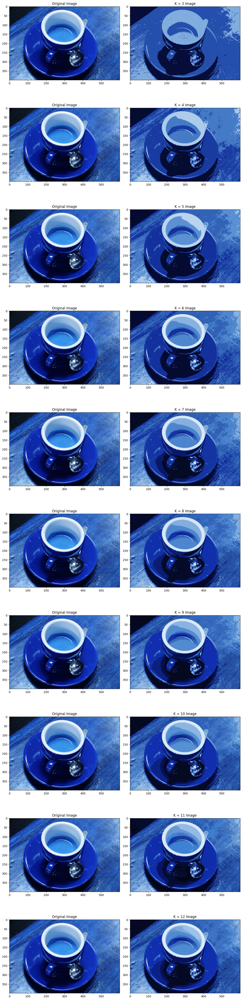

In [ ]:
# Кластеризация
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12, 50)

img = data.coffee()
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

Z = img_rgb.reshape((-1, 3))
Z = np.float32(Z)

criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)

fig, ax = plt.subplots(10, 2, figsize=(12, 50)) 
for i in range(10):
    K = i + 3
    # apply K-means algorithm
    ret, label, center = cv.kmeans(Z, K, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
    
    center = np.uint8(center)
    res = center[label.flatten()]
    res2 = res.reshape((img_rgb.shape))
    
    ax[i, 1].imshow(res2)
    ax[i, 1].set_title('K = %s Image' % K)
    ax[i, 0].imshow(img_rgb) 
    ax[i, 0].set_title('Original Image')

plt.tight_layout()
plt.show()

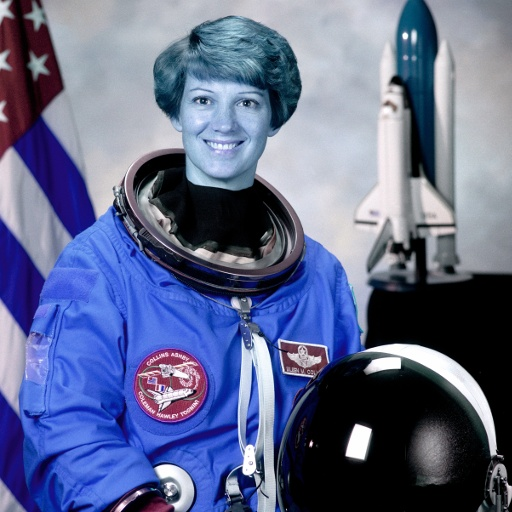

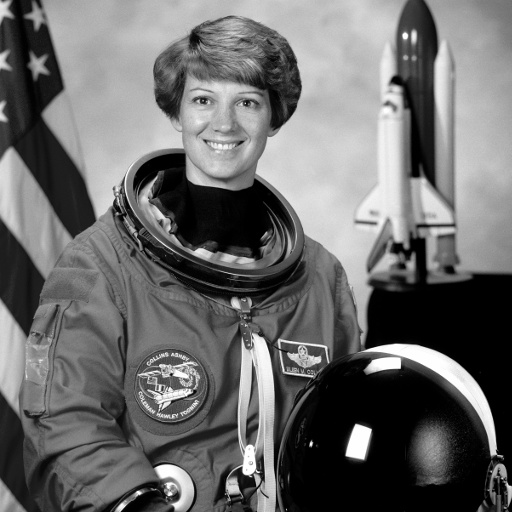

In [ ]:
import cv2
import numpy as np
from IPython.display import Image, display
from matplotlib import pyplot as plt

def imshow(img, ax=None):
    if ax is None:
        ret, encoded = cv2.imencode(".jpg", img)
        display(Image(encoded))
    else:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.axis('off')

img = data.astronaut()
imshow(img)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(gray)



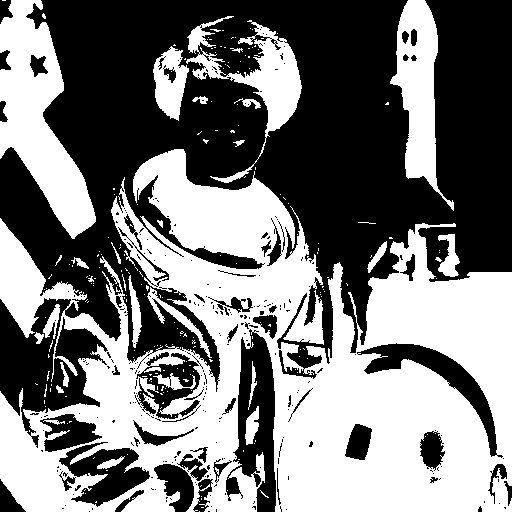

In [26]:
#Threshold Processing
ret, bin_img = cv2.threshold(gray,
                             0, 255, 
                             cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
imshow(bin_img)

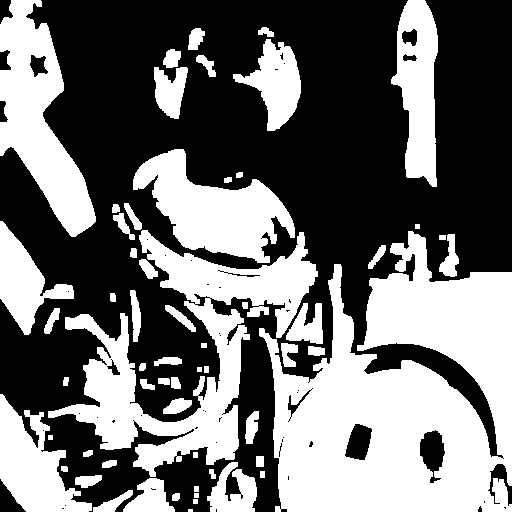

In [27]:
'''Шаг 4. Удаление шума
Чтобы очистить контур (границу) объекта, шум удаляется с помощью морфологической градиентной обработки.
Обработка Морфологического градиента
Морфологический градиент — это инструмент, используемый в морфологической обработке изображений для выделения краёв и границ объектов на изображении. Он получается путём вычитания эрозии изображения из его дилатации. Эрозия уменьшает яркость областей на изображении, а дилатация увеличивает их, и морфологический градиент представляет собой разницу между этими двумя операциями. Эта операция полезна при решении таких задач, как обнаружение объектов и сегментация, а также может сочетаться с другими морфологическими операциями для усиления или фильтрации определённых характеристик изображения.
'''

# noise removal
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
bin_img = cv2.morphologyEx(bin_img, 
                           cv2.MORPH_OPEN,
                           kernel,
                           iterations=2)
imshow(bin_img)


Определение чёрного фона и переднего плана изображения

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..59.59692].


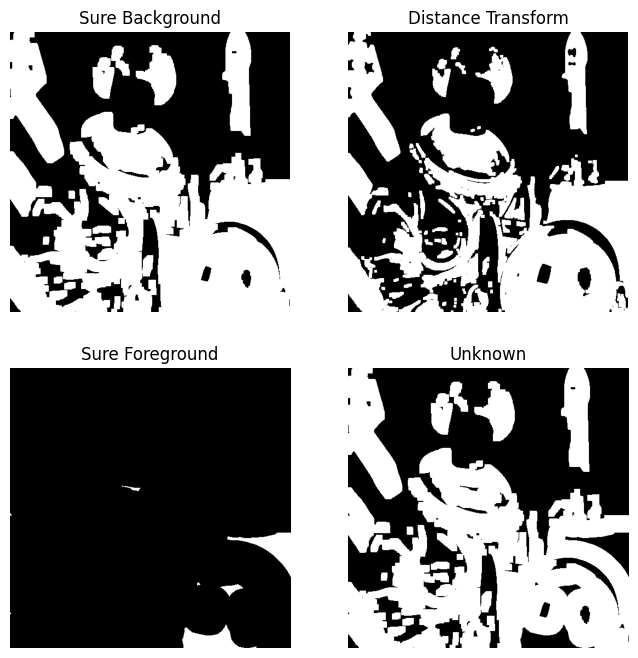

In [ ]:

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))

sure_bg = cv2.dilate(bin_img, kernel, iterations=3)
imshow(sure_bg, axes[0,0])
axes[0, 0].set_title('Sure Background')

dist = cv2.distanceTransform(bin_img, cv2.DIST_L2, 5)
imshow(dist, axes[0,1])
axes[0, 1].set_title('Distance Transform')


ret, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, cv2.THRESH_BINARY)
sure_fg = sure_fg.astype(np.uint8)  
imshow(sure_fg, axes[1,0])
axes[1, 0].set_title('Sure Foreground')


unknown = cv2.subtract(sure_bg, sure_fg)
imshow(unknown, axes[1,1])
axes[1, 1].set_title('Unknown')

plt.show()

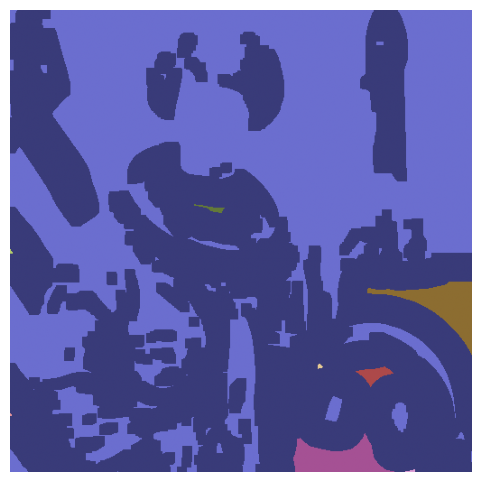

In [ ]:
'''Создание изображения маркера'''

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)

markers += 1

markers[unknown == 255] = 0

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(markers, cmap="tab20b")
ax.axis('off')
plt.show()

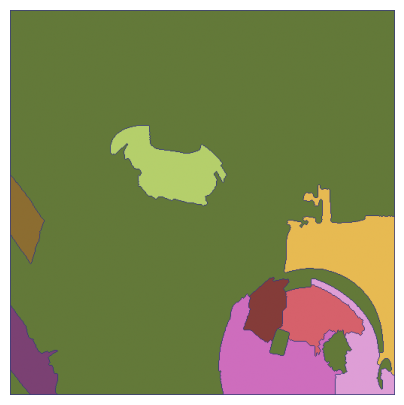

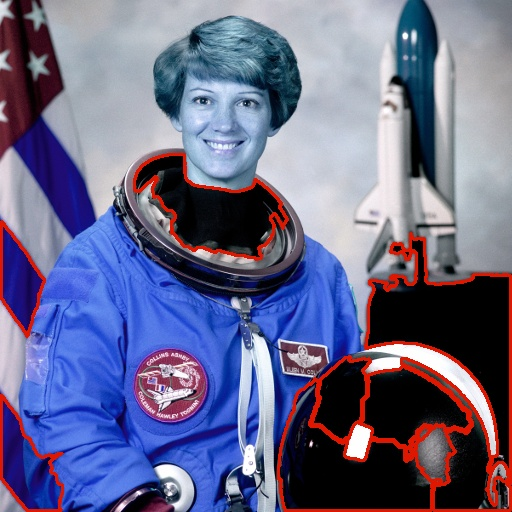

In [ ]:
'''Применение алгоритма Watershed к маркерам'''

# watershed Algorithm
markers = cv2.watershed(img, markers)

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(markers, cmap="tab20b")
ax.axis('off')
plt.show()


labels = np.unique(markers)

coins = []
for label in labels[2:]:  

    target = np.where(markers == label, 255, 0).astype(np.uint8)
  
    contours, hierarchy = cv2.findContours(
        target, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    coins.append(contours[0])

img = cv2.drawContours(img, coins, -1, color=(0, 23, 223), thickness=2)
imshow(img)